# Lecture 3 Image Analysis

This notebook will let you analyze images using the OpenAI Vision API, also known as the GPT-4V API.  
Details on the OpenAI Vision API can be found here:
https://platform.openai.com/docs/guides/vision

Below is the overview of this notebook.

<ol type = 1>
  <li> Generate Text Description of an Image</li>
  <li> Analyze a Cluster of Images</li>
  <li> Generate an Image Using Example Images </li>
  <li> Modify an Image </li>
  <li> Novel Image Analysis </li>
  <li> Generate Text Narration for a Video </li>
 </ol>

Before starting, select "Runtime->Factory reset runtime" to start with your directories and environment in the base state.

If you want to save changes to the notebook, select "File->Save a copy in Drive" from the top menu in Colab.  This will save the notebook in your Google Drive.


# Clones, Installs, and Imports

## Clone Repo

In [1]:
# Clone GitHub repository
!git clone https://github.com/zlisto/social_media_genAI

import os
os.chdir("social_media_genAI/main")


Cloning into 'social_media_genAI'...
remote: Enumerating objects: 1886, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 1886 (delta 3), reused 16 (delta 2), pack-reused 1863 (from 2)
Receiving objects: 100% (1886/1886), 230.18 MiB | 12.28 MiB/s, done.
Resolving deltas: 100% (180/180), done.
Updating files: 100% (1498/1498), done.


## Installs

In [2]:
# Install requirements
!pip install -q -r requirements.txt


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 28.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 548.3/548.3 kB 35.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 55.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.7/294.7 kB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.6/313.6 kB 21.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.5.1+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu1

## Imports

In [123]:
import pandas as pd
import datetime
import textwrap as tr
import os
import time
import ast
import openai
import subprocess
from datetime import datetime, timedelta
import base64
import requests
import random
import matplotlib.pyplot as plt
from IPython.display import display, Image, HTML, Audio, Video
from PIL import Image as PILImage
import matplotlib.image as mpimg
from moviepy.editor import ImageClip, AudioFileClip, concatenate_videoclips
import requests
from io import BytesIO
import numpy as np
import math
from google.colab import userdata
from tqdm import tqdm
import cv2  # We're using OpenCV to read video, to install !pip install opencv-python

#helper functions for using ChatGPT
from scripts.genai import GenAI


#this option makes it so tweets display nicely in a dataframe
pd.set_option("display.max_colwidth", None)

#this code sets the font sizes for plots
plt.rcParams.update({'axes.labelsize': 18,
                     'xtick.labelsize': 14,
                     'ytick.labelsize': 14,
                     'figure.figsize':(8,6),
                     'axes.grid':True})


## OpenAI API

We can input the key the key sidebar on the left side (it looks like a key).  Make sure you call it OPENAI_API_KEY (case sensitive) and paste the value there.  Make sure you toggle it so the notebook has access to the key.  Then you can load it using the `userdata.get` function.

In [119]:
OPENAI_API_KEY = userdata.get('OPENAI_API_KEY')

In [120]:
# Initialize GenAI
jarvis = GenAI(OPENAI_API_KEY)

text = "Who are you?"
instructions = "You are a helpful assistant."
response = jarvis.generate_text(text, instructions)
print(f"Human:{text}\nAI:{response}")

Human:Who are you?
AI:I am an AI language model created by OpenAI. I'm here to assist you by providing information, answering questions, and helping with a variety of topics. What can I help you with today?


# Generate Text Description of Image

We will use Vision to generate a text description of an image.

## Choose Image

We have some images on the GitHub repo we can use.  Set the `image_path` of the image you want to analyze.  We will convert this to an `image_url` with the `encode_image` function.   Then show the image with the `display` and `Image` methods.

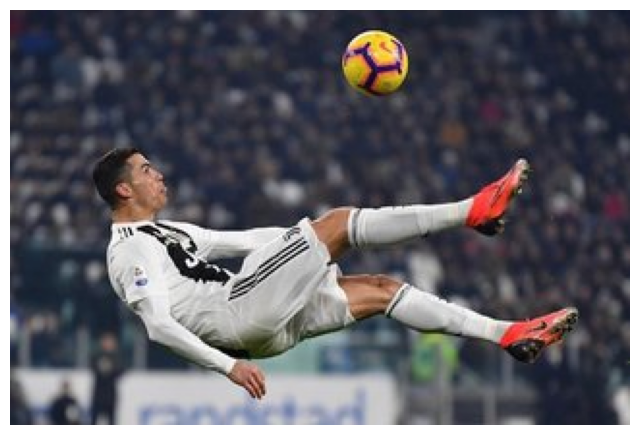

In [20]:
# Path to your image
screen_name = 'cristiano'
image_path = f"data/image_compressed_{screen_name}/1940704341532300698_173560420_small.jpeg"

# Read and display the image
# Open image using PIL
img = PILImage.open(image_path)

# Display the image
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()


## Generate Image Description

Provide `instructions` to tell Vision what you want to know about the picture.  You can make the `instructions` as detailed as you want, or give it any analysis task you like.

We need to convert `image_url` to a list of urls called `image_urls`.  Then we provide the `image_urls` list and `instructions` to Vision  with the `generate_image_description` function to generate the `image_description`.  

The function `generate_image_description` is written to take in a list of urls for multiple images.  We will use this ability later in this notebook.

In [21]:
help(jarvis.generate_image_description)

Help on method generate_image_description in module scripts.genai:

generate_image_description(image_paths, instructions, model='gpt-4o-mini') method of scripts.genai.GenAI instance
    Generates a description for one or more images using OpenAI's vision capabilities.
    
    Parameters:
    ----------
    image_paths : str or list
        Path(s) to the image file(s).
    instructions : str
        Instructions for the description.
    model : str, optional
        The OpenAI model to use (default is 'gpt-4o-mini').
    
    Returns:
    -------
    str
        A textual description of the image(s).



In [22]:
instructions = '''Describe this image in vivid detail.'''
image_description = jarvis.generate_image_description(image_path, instructions)
print(tr.fill(image_description))

In the image, a football player is captured mid-action as he performs
an impressive acrobatic move on the pitch. His body is horizontal,
suspended in the air, with his back arched and legs extended. He wears
a sleek Juventus jersey, featuring prominent black and white stripes,
which contrasts sharply against the blurred background of a packed
stadium.  The player's expression conveys determination and focus,
embodying the intensity of the moment. His right foot is poised to
connect with the ball, which is just above him, glowing under the
stadium lights. The ball is vibrant, with its yellow and purple design
standing out vividly against the dark hues of the crowd, creating a
sense of dynamism.  The atmosphere is electric, captured by the
blurred faces of spectators in the background, all watching in
anticipation. The scene is filled with energy, showcasing the
athleticism and skill of the player as he executes this remarkable
maneuver. The contrasting colors and the movement within the

## Generate Caption for Image

We can use Vision to generate an Instagram caption directly from the image.  We give our new `instructions` and `new_image_url` of the AI generated picture to the `generate_image_description` function.  Make sure to make the url into a list called `image_urls`.

In [23]:
instructions = '''Write an engaging, emotional caption for an Instragram
post for this picture.  Dont make it too long.  Write as if you were
Cristiano Ronaldo.'''

image_caption = jarvis.generate_image_description(image_path, instructions)
print(tr.fill(image_caption))

"Sometimes, to reach new heights, you have to embrace the fall.
Dedication and passion lead the way. Let’s keep aiming for greatness!
⚽️✨ #NeverGiveUp"


## Instagram Post

Use the `display_IG` function to show the new image and its caption as an Instagram post.  You will need to create the base 64 encoding of the image with the `encode_image` function, and the format it as a url for the `display_IG` function. You will need a `screen_name` for the post as well.

In [26]:
help(jarvis.encode_image)

Help on method encode_image in module scripts.genai:

encode_image(image_path) method of scripts.genai.GenAI instance
    Encodes an image file into a base64 string.
    
    Parameters:
    ----------
    image_path : str
        The path to the image file.
    
    Returns:
    -------
    str
        Base64-encoded image string.




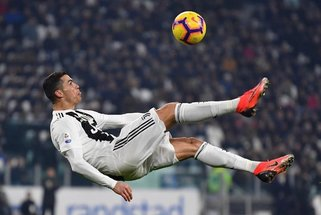

In [29]:
image_base64 = jarvis.encode_image(image_path)
image_url = f"data:image/jpeg;base64,{image_base64}"
jarvis.display_IG(image_caption, image_url, screen_name);

## Compare Multiple Images

We can look at two images and compare them.    Below is some code to do that.  First we define the image paths and display them.  Then we feed the paths in a list `image_paths` and give `instructions` to the AI on how to analyze them.

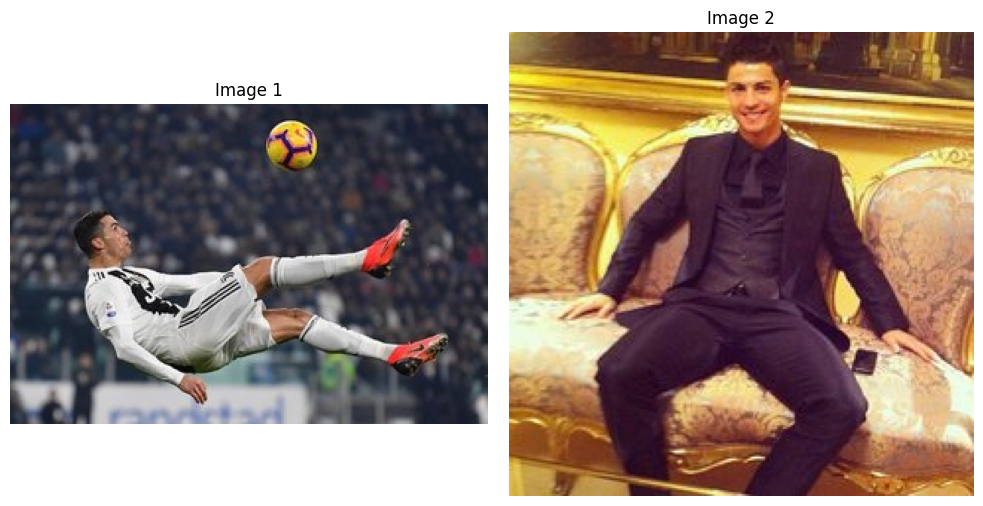

In [31]:
# prompt: image_path1 = f"data/image_compressed_cristiano/1940704341532300698_173560420_small.jpeg"
# image_path2 = f"data/image_compressed_cristiano/339829380283274523_173560420_small.jpeg"
# . plot these two images side by side and title them image 1 and image 2

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image_path1 = f"data/image_compressed_cristiano/1940704341532300698_173560420_small.jpeg"
image_path2 = f"data/image_compressed_cristiano/339829380283274523_173560420_small.jpeg"

# Create a figure and axes
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Display the first image
img1 = mpimg.imread(image_path1)
axes[0].imshow(img1)
axes[0].set_title("Image 1")
axes[0].axis('off')

# Display the second image
img2 = mpimg.imread(image_path2)
axes[1].imshow(img2)
axes[1].set_title("Image 2")
axes[1].axis('off')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()




In [35]:
image_paths = [image_path1, image_path2]
instructions = '''Which of these two images would get
more engagement on Instagram from Ronaldo's followers?'''
instructions += '''Return your answer as a pretty easy to read HTML
with dark background and big font for people with bad eyes like me
 with a title and then a  table
formatted like Best Image Description: <image description>,
Reasoning: <reasoning explaining why better image is better and worse image
is worse>.'''
analysis = jarvis.generate_image_description(image_paths, instructions)
display(HTML(analysis))

Best Image Description,Reasoning
Cristiano Ronaldo performing a bicycle kick during a match.,"This image showcases Ronaldo's athleticism and skill, elements that resonate strongly with sports fans. Action shots typically garner more engagement due to their dynamic nature, while the second image feels more static and less engaging for followers interested in his football career."


# Novel Image Analysis

We can perform all sorts of novel analyses of an image with Vision.  We will try some here.  

## Choose an Image

Select an `image_path` from the many photos in the `data` folder and dislay it.

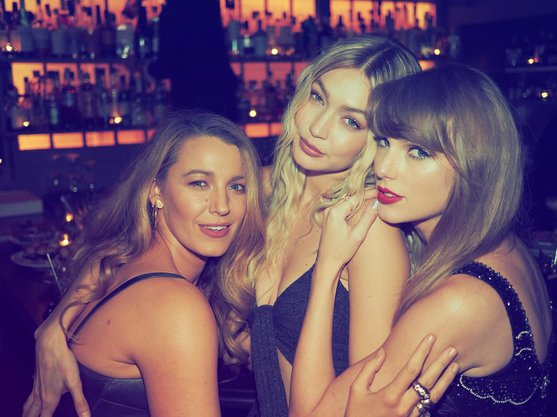

In [54]:
# prompt: display image in image_path data/image_compressed_taylorswift/3257832937675804913_11830955_small.jpeg

image_path = 'data/image_compressed_taylorswift/3257832937675804913_11830955_small.jpeg'
Image(filename= image_path)


## Analysis Instructions
A few things you can try are:

1. What is the sentiment of the people in the image?

2. What do you think the people in the image are saying?

3. What music could play in the background of this image?

4. Write an Instagram caption for this image.

5. How can this image be improved so it gets more clicks on Instagram?

6. What would be a good variation of this image to create more variety in the Instagram feed?

7. Provide a fashion report of the attire of the people in this image that would be great for Vogue magazine.

8.  What is the political affiliation of the people in this image?

We also add `instructions_format` to `instructions` telling Vision to return the answer as an HTML so it is easier to read.

In [55]:
instructions_sentiment = '''What is the sentiment of the image on a scale of 0 to 10.
Give the sentiment score and reason why.'''

instructions_conversation = '''Write a possible dialogue between
the people in this image'''

instructions_music = '''Suggest some songs for a Spotify list to
play in the background of this image to match the mood of the people
in the image.'''

instructions_caption = '''Write an Instagram caption for this image for the account of
an American music pop mega-star.'''

instructions_improve = '''How can this image be improved so it gets
more clicks on Instagram?'''


instructions_fashion = '''Describe the attire of the people
in this image as if it was for a feature spread in Vogue magazine?'''

instructions_political = '''What is the political affiliation of the people in this image?'''

#formatting instructions
instructions_format = '''Return the answer as an easy to read HTML formatted string
with big font and dark background and a nice title.'''

## Analyze Image

Choose the instructions from the previous cell and set `instructions` equal to it.  Add in the formatting instructions string `instructions_format` and then give it to Vision for analysis.

In [56]:
instructions = instructions_fashion
instructions += instructions_format  #make sure to tell Vision to return the answer as HTML

image_analysis = jarvis.generate_image_description(image_path, instructions)
display(HTML(image_analysis))



# Search Image Database

We will take a folder of images and create an index from it.  Then we will search for images that match our queries.

## Describe the images

Choose your `image_directory` where the images are.  Then use a for loop
to go through each image and describe it. Save these descriptions and image paths to a dataframe `df`.  We will only sample 10 images to save time.

Processing Images:   0%|          | 0/10 [00:00<?, ?file/s]

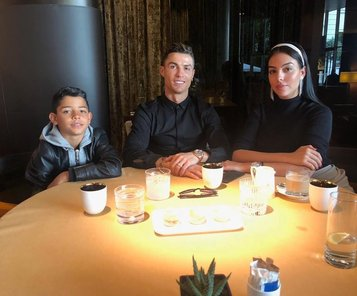

Processing Images:  10%|█         | 1/10 [00:04<00:41,  4.59s/file]

2016073265285494448_173560420_small.jpeg: The image shows three individuals seated at a round table in a dining
setting. The atmosphere appears warm and inviting, with soft lighting
and a cozy ambiance.   On the left side of the image, there is a young
boy with dark hair, dressed in a black leather jacket and a light gray
hoodie. He has a cheerful expression, engaging with the camera.  In
the center sits a man wearing a fitted black long-sleeve shirt. He has
a friendly smile that conveys confidence and warmth. He has a well-
groomed appearance, with short dark hair and a slight stubble,
suggesting a polished yet casual look.  To the right is a woman
dressed in a snug black sweater and wearing her hair pulled back,
complemented by a white headband. She has an elegant demeanor and is
looking towards the camera with a poised expression.  The table is set
with a variety of beverages and small plates. There are two cups of
coffee, a few glasses of water, and a central plate with desserts or

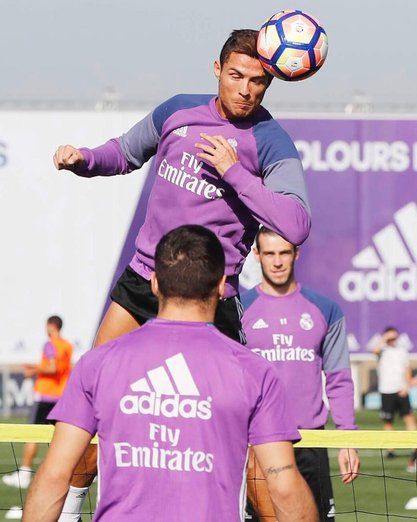

Processing Images:  20%|██        | 2/10 [00:08<00:33,  4.21s/file]

1349981723609473978_173560420_small.jpeg: The image captures a dynamic moment from a football training session
featuring players from Real Madrid.   In the foreground, a player
wearing a purple training kit with the logo "Fly Emirates" on the
chest is positioned directly beneath the path of a soccer ball that is
being headed. The player is focused, with a concentrated expression,
signaling that they are about to make an important play.   In the
background, another player, also in a purple kit, appears to be
executing a jump in preparation for heading the ball as well. Their
body language shows determination, capturing the intensity of the
training session.   The setting is bright and sunny, indicative of an
outdoor training facility, with a blurred team banner in purple and
white visible in the backdrop. The atmosphere suggests a high-energy
practice as the players are honing their skills.   Overall, the image
illustrates a moment of athleticism, teamwork, and the dedication
involved i

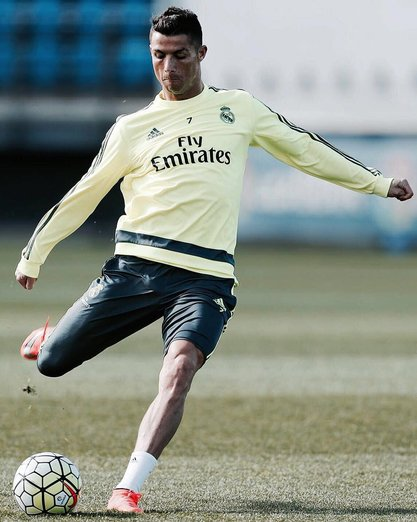

Processing Images:  30%|███       | 3/10 [00:13<00:31,  4.43s/file]

1192723489644517132_173560420_small.jpeg: The image depicts a male football player engaged in a training
session. He is wearing a bright yellow long-sleeve training jersey
emblazoned with "Real Madrid" and the sponsor "Fly Emirates." The
jersey features black stripes running down the shoulders and sides,
giving it a sporty appearance.  He is in mid-kick, displaying dynamic
movement as he strikes a football that is on the ground. The player's
stance showcases athleticism, with one leg extended forward for the
kick while the other leg is bent slightly for balance. His posture
emphasizes the motion and intent behind the action.  The player has
short, dark hair, and his facial expression indicates focus and
determination. He is wearing dark training shorts that complement the
bright jersey. His footwear consists of specialized football boots,
which are likely designed for competitive play.  The background
features a grassy training pitch with a blurred view of bleachers or
chairs, suggesti

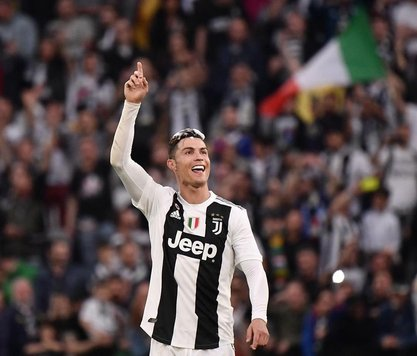

Processing Images:  40%|████      | 4/10 [00:19<00:31,  5.32s/file]

2027129285264801801_173560420_small.jpeg: The image captures a moment from a football match featuring a player
wearing a white and black striped jersey with the logo "Jeep"
prominently displayed on the front. The player, who appears to be in
an exuberant celebration, is raising one finger while smiling widely,
indicating a moment of triumph or accomplishment.  The background is
filled with fans, some holding flags, creating a vibrant atmosphere
typical of a stadium. One of the flags is the tricolor flag of Italy,
adding a patriotic touch to the scene. The surrounding fans are
wearing various jerseys and are engaged, which enhances the sense of
excitement.  The player has short hair and appears fit, embodying the
typical athletic physique associated with top-level footballers. The
stadium is well-lit, highlighting both the player and the crowd, and
giving a sense of the event's grandeur. The overall scene encapsulates
the passion and fervor of a live sports event.


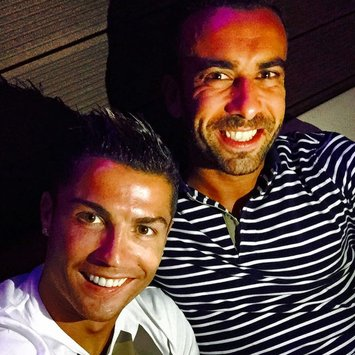

Processing Images:  50%|█████     | 5/10 [00:26<00:28,  5.69s/file]

1049465126505584391_173560420_small.jpeg: The image captures two men smiling as they pose closely together for a
selfie. They appear to be enjoying a playful moment, likely in a
social setting.   The first individual, on the left, has a well-
defined jawline and a radiant smile, showcasing bright white teeth.
His hair is styled neatly, and he is wearing a white T-shirt that has
slight detailing around the neckline. The lighting gives his skin a
warm tone, enhancing the overall cheerful ambiance of the photo.  Next
to him, the second individual has a more rugged look with a thicker,
darker beard and is dressed in a striped shirt with alternating dark
and light colors. His smile is broad and inviting, indicating a sense
of friendliness and camaraderie. The subtle background, with wooden
panels and soft lighting, adds a relaxed vibe to the scene.  Overall,
the expression on their faces suggests they are having a good time,
and the warm lighting complements the joyful nature of the image.


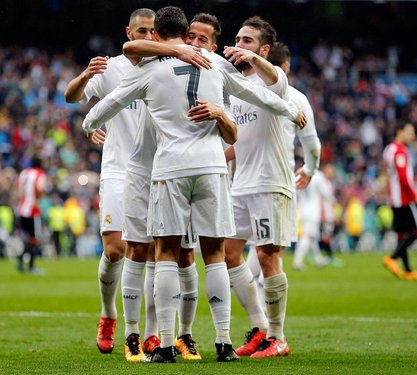

Processing Images:  60%|██████    | 6/10 [00:30<00:20,  5.20s/file]

1184190017011357082_173560420_small.jpeg: The image depicts a moment of celebration among several soccer players
wearing white uniforms, indicating they are likely part of a team
known for this color, such as Real Madrid. The players are gathered
closely together, their expressions joyful, as they embrace and
congratulate one another after a successful play or goal.   One
player, wearing the number 7 jersey, is at the center of the
celebration, with two teammates leaning in to hug him. Their body
language conveys excitement and camaraderie. The players appear to be
on the field, surrounded by a blurred crowd in the background,
suggesting a stadium atmosphere filled with fans. The grass appears
well-maintained, and the players’ uniforms are pristine, indicating
this is likely a significant match.   The scene captures the intensity
and emotion associated with soccer, emphasizing teamwork and the
thrill of scoring. Overall, it is a vivid representation of
sportsmanship and unity in athlet

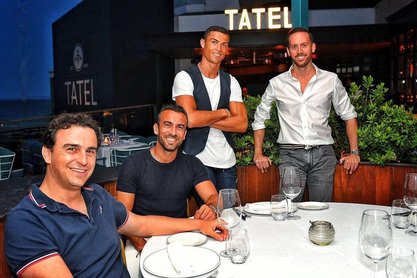

Processing Images:  70%|███████   | 7/10 [00:33<00:13,  4.55s/file]

1561144510738063145_173560420_small.jpeg: The image features a group of four men gathered around a dining table
outside a restaurant named "Tatel." The setting appears to be during
twilight, with a soft evening glow enhancing the ambiance.   The table
is elegantly set with several empty wine glasses and plates arranged
neatly. The men are casually dressed, suggesting a relaxed social
gathering. One man is seated at the table, wearing a dark shirt with a
short sleeve. To his left, another man is also seated, sporting a
fitted black shirt.   Standing behind them are two men. One is wearing
a fitted white shirt and appears confident, with his arms crossed. The
other man, also standing, is dressed in a sleeveless top, showcasing a
muscular physique.   The background features the restaurant signage
and greenery, adding to the overall inviting atmosphere of the scene.
The lighting hints at a pleasant evening, perfect for dining and
socializing.


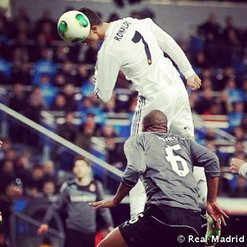

Processing Images:  80%|████████  | 8/10 [00:37<00:08,  4.42s/file]

644100379914966771_173560420_small.jpeg: The image depicts a dynamic moment in a soccer match. In the
foreground, a player wearing a white jersey with the name "RONALDO"
and the number "7" is executing a powerful leap to head the ball. His
arms are elevated, and his posture indicates a strong focus on the
incoming ball.   Below him, another player, dressed in a grey jersey
with the number "6," is positioned in a defensive stance, seemingly
attempting to challenge for the ball. The contrast in their heights
highlights the agility and athleticism of the player leaping above.
In the background, the stadium is filled with spectators, although
they are somewhat blurred, focusing attention on the players in
action. The overall mood conveys the intensity of the game, showcasing
a crucial moment of skill and competition. The branding "Real Madrid"
appears at the bottom right, reinforcing the context of the match.


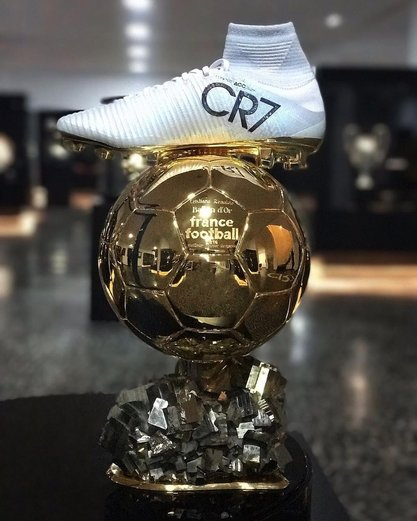

Processing Images:  90%|█████████ | 9/10 [00:41<00:04,  4.09s/file]

1422341294222530034_173560420_small.jpeg: The image features a visually arresting display centered around a
prestigious trophy known as the Ballon d'Or, an award given annually
for the best football player in the world. The trophy is crafted in a
shiny gold, featuring a spherical design made up of several pentagonal
panels that resemble a classic football.   Atop the trophy, there is a
sleek, white football boot prominently displayed, which is adorned
with the initials "CR7," a well-known reference to a famous football
player. The boot's design is modern and streamlined, reflecting high
performance, with subtle texture patterns that suggest a high-tech
material.  The trophy rests on a base that appears to be made of
crystal or a similar reflective material, adding to its prestigious
appearance. The setting is well-lit, enhancing the glimmer of the gold
and the boot, while the background is blurred, likely showcasing other
trophies or exhibits that emphasize the accomplishment on displa

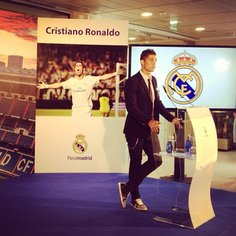

Processing Images: 100%|██████████| 10/10 [00:48<00:00,  4.84s/file]

545557452134192947_173560420_small.jpeg: The image features a well-dressed man standing at a podium during a
press conference. He is wearing a dark suit and tie, exuding a
polished appearance. The background showcases a banner with the iconic
Real Madrid logo and an image of the same individual celebrating on
the field. The setting appears to be a well-lit auditorium or
conference room, with a blue carpet and strategic lighting that
highlights the speaker.  In front of the podium, there are two water
bottles, likely provided for the speaker's convenience. The atmosphere
suggests an important announcement or event related to football.
Behind the podium, the backdrop features the emblem of Real Madrid
prominently displayed, symbolizing the renowned football club and its
legacy. The image captures a moment of significance, possibly marking
a milestone in the speaker's career.


In [124]:
instructions = """Describe this image in great detail"""
image_directory = "data/image_compressed_cristiano"
image_paths = os.listdir(image_directory)
image_paths = random.sample(image_paths, 10)

dict_list = []
for filename in tqdm(image_paths, desc="Processing Images", unit="file", total=len(image_paths)):
  if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
      image_path = os.path.join(image_directory, filename)
      img = PILImage.open(image_path)
      display(img)  # Display image in Jupyter Notebook
      image_description = jarvis.generate_image_description(image_path, instructions)
      print(f"{filename}: {tr.fill(image_description)}")
      dict_list.append({"image_path": image_path,
                        "description": image_description})
df = pd.DataFrame(dict_list)



## Search for images

Your `prompt` is the kind of image you are looking for.  Then ask the AI to return the best image image_paths as a nice JSON object.  We can then parse this object to display the images.

In [132]:
instructions = """You will return the image_paths as a JSON dictionary
list with structure {'image_path_list':[{'image_path':image_path},...} of the images from this
list of images that has description that best matche the query given to you.  You can return
1 or more than 1 image."""

df_string = "\n".join([f'"image_path": "{row["image_path"]}", "description": "{row["description"]}"' for _, row in df.iterrows()])

instructions+=f"\n{df_string }"

prompt = "An exciting game play image"

image_paths_dict = ast.literal_eval(jarvis.generate_text(prompt, instructions, output_type="json_object"))
image_paths = image_paths_dict['image_path_list']
print(f"Prompt: {prompt}")
print(f"{len(image_paths)} matching images found")






Prompt: An exciting game play image
2 matching images found


An exciting game play image


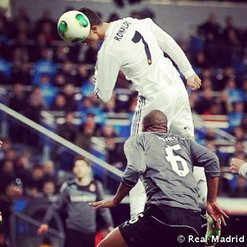

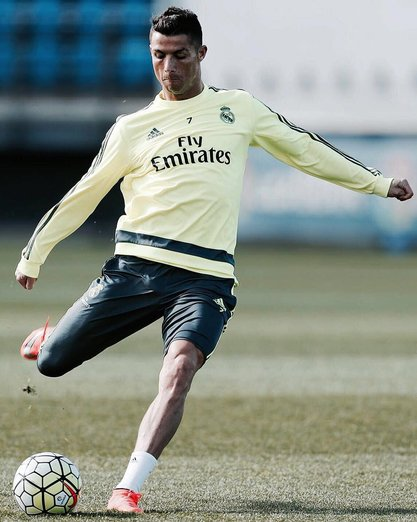

In [133]:
print(prompt)
for image_path in image_paths:
    display(Image(filename=image_path['image_path']))

# Generate Text Narration of a Video

We will take a short video from Instagram and generate a voice narration for it.

'{"image_path":{"0":"data\\/image_compressed_cristiano\\/1033947721486472923_173560420_small.jpeg","1":"data\\/image_compressed_cristiano\\/1577194365755193652_173560420_small.jpeg","2":"data\\/image_compressed_cristiano\\/1165265211826279924_173560420_small.jpeg","3":"data\\/image_compressed_cristiano\\/1611029287699674849_173560420_small.jpeg","4":"data\\/image_compressed_cristiano\\/1869768867301338698_173560420_small.jpeg","5":"data\\/image_compressed_cristiano\\/1620600906055055231_173560420_small.jpeg","6":"data\\/image_compressed_cristiano\\/2013966480236046823_173560420_small.jpeg","7":"data\\/image_compressed_cristiano\\/2027129285264801801_173560420_small.jpeg","8":"data\\/image_compressed_cristiano\\/1371899109476274615_173560420_small.jpeg","9":"data\\/image_compressed_cristiano\\/1214108470744618096_173560420_small.jpeg"},"description":{"0":"The image depicts a young man with a well-defined, athletic physique, likely in a setting related to sports. His hair is dark, styled

## Get video data

We provide the `video_path` to the video we want to analyze and extract some information about it, the most important being its `duration_sec` (duration in seconds).  We will need the duration to determine how long the narration is.

You can view the video using the `Video` function.

In [7]:
# Path to your video
video_path = "data/videos/Jadakiss - Green Sweats.mp4"



# Load the video to get its dimensions
cap = cv2.VideoCapture(video_path)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH) // 2)  # Scale down by 50%
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT) // 2)
fps = cap.get(cv2.CAP_PROP_FPS)
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
duration_sec = frame_count / fps
print(f"Video is {duration_sec} seconds")
# Release the video capture object
cap.release()

# Display the video with the new dimensions
Video(video_path, embed=True, width=width, height=height)



Video is 20.0 seconds


## Instrctions for video narration

Write some `instructions_base` for the video narration.  We will give the `video_path` and `instructions` to Vision to generate the narration text for the video. We can choose the style and duration of the narration.  We want it to be the length of the video.  People speak about 200 words per minute.  Using this, plus the video duration you can figure out `nwords_max`, the maximum length of the narration.

In [57]:
#Instructions for different videos in repo

instructions_base = f'''These are frames from a video that I want to upload
 for the rapper Jadakiss from Yonkers. Create a short narration script
 for this video in the style of Jadakiss
 that would get someone excited to buy the clothes he is wearing. '''


wps = 200/60  #words per second in normal speech
nwords_max = round(duration_sec*wps)  #max number of words in the voice over
#formatting instructions
instructions_format =  f'''The narration should have less than {nwords_max} words.
 Only include the narration. '''

print(instructions_format)


instructions = instructions_base + instructions_format  #make sure to tell Vision to return the answer as HTML

print(instructions)


The narration should have less than 67 words.
 Only include the narration. 
These are frames from a video that I want to upload
 for the rapper Jadakiss from Yonkers. Create a short narration script
 for this video in the style of Jadakiss
 that would get someone excited to buy the clothes he is wearing. The narration should have less than 67 words.
 Only include the narration. 


## Genarte video narration

We will use the `generate_video_description` function to create the narration.  Use the `help` function to see what inputs the function takes.

In [11]:
help(jarvis.generate_video_description)

Help on method generate_video_description in module scripts.genai:

generate_video_description(fname_video, instructions, max_samples=15, model='gpt-4o-mini') method of scripts.genai.GenAI instance
    Generates a textual description of a video by analyzing sampled frames.
    
    Parameters
    ----------
    fname_video : str
        Path to the video file.
    instructions : str
        Guidelines for generating the description.
    max_samples : int, optional
        Maximum number of frames to sample from the video (default is 15).
    model : str, optional
        OpenAI model used for generating the description (default is 'gpt-4o-mini').
    
    Returns
    -------
    str
        A descriptive summary of the video content.



In [12]:
narration = jarvis.generate_video_description(video_path, instructions)
print(tr.fill(narration))

Yo, it's Jadakiss, and when you see me in this fit, you know it’s all
about style and swagger. These kicks got that fresh twist, while the
gear turns heads everywhere. You wanna stand out? This ain’t just
clothing; it’s a statement. Grab what’s fly and get in the game—let’s
make waves together! Don’t sleep on this heat; it’s time to elevate
your wardrobe!


## Generate Audio of Narration for Video

We can use the `generate_audio` function to convert the text `narration` into an audio file that we save to `audio_path` which should be a `.mp3` file.  We can choose the voice we want.
Experiment with different voices (alloy, echo, fable, onyx, nova, and shimmer) to find one that matches your desired tone and audience. The current voices are optimized for English.

https://platform.openai.com/docs/guides/text-to-speech

In [58]:
help(jarvis.generate_audio)

Help on method generate_audio in module scripts.genai:

generate_audio(text, file_path, model='tts-1', voice='nova', speed=1.0) method of scripts.genai.GenAI instance
    Generates an audio file from the given text using OpenAI's text-to-speech (TTS) model.
    
    Parameters
    ----------
    text : str
        The input text to be converted into speech.
    file_path : str
        The output file path where the generated audio will be saved.
    model : str, optional
        The OpenAI TTS model to use (default is 'tts-1').
    voice : str, optional
        The voice to use for synthesis. Available voices:
        - 'nova' (default)
        - 'alloy'
        - 'echo'
        - 'fable'
        - 'onyx'
        - 'shimmer'
    speed : float, optional
        The speech speed multiplier (default is 1.0).
    
    Returns
    -------
    bool
        Returns True if the audio file is successfully generated and saved.



In [13]:
audio_path = video_path.replace(".mp4", "_narration.mp3")

jarvis.generate_audio(narration, audio_path, voice="alloy")



True

## Listen to Narration Audio

In [15]:
print(tr.fill(narration))
audio = Audio(filename=audio_path)
display(audio)



Yo, it's Jadakiss, and when you see me in this fit, you know it’s all
about style and swagger. These kicks got that fresh twist, while the
gear turns heads everywhere. You wanna stand out? This ain’t just
clothing; it’s a statement. Grab what’s fly and get in the game—let’s
make waves together! Don’t sleep on this heat; it’s time to elevate
your wardrobe!


## Adding Audio to Video


The code here lets you automatically add the audio to the video.  You need to install some software to do it.


If you don't like the coding, you can instead use one of the many video editing softwares available online.  One you can use is this: https://online-video-cutter.com/video-editor

In [16]:
#install ffmeg and the python wrapper ffmpeg-python
!apt-get update && apt-get install -y ffmpeg
!pip install ffmpeg-python


Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,312 kB]
Get:8 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [2,609 kB]
Get:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease [18.1 kB]
Get:10 http://security.ubuntu.com/ubuntu jammy-security/restricted amd64 Packages [3,612 kB]
Get:11 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Hit:12 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:13 https://p

In [22]:
#helper function to merge audio with video

def replace_audio_in_video(video_path, audio_path, video_path_new=None):
    """
    Replaces the audio in a video file with an external audio file and saves the new video.

    Parameters
    ----------
    video_path : str
        Path to the input video file.
    audio_path : str
        Path to the input audio file that will replace the existing audio.
    video_path_new : str, optional
        Path to save the new video with the replaced audio.
        If not provided, "_new" is appended before the file extension of `video_path`.

    Returns
    -------
    str
        The path to the new video file with replaced audio.
    """

    # Generate default output path if not provided
    if video_path_new is None:
        base, ext = os.path.splitext(video_path)
        video_path_new = f"{base}_new{ext}"

    try:
        # Construct FFmpeg command
        command = [
            "ffmpeg",
            "-i", video_path,         # Input video
            "-i", audio_path,         # Input audio
            "-c:v", "copy",           # Copy video codec (no re-encoding)
            "-c:a", "aac",            # Encode audio in AAC format
            "-map", "0:v:0",          # Use video stream from first input
            "-map", "1:a:0",          # Use audio stream from second input
            "-y",                     # Overwrite output if it exists
            video_path_new             # Output file
        ]

        # Run FFmpeg command
        result = subprocess.run(command, stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)

        # Check for errors
        if result.returncode != 0:
            print(f"FFmpeg error:\n{result.stderr}")
            return None

        print(f"New video saved at: {video_path_new}")
        return video_path_new

    except Exception as e:
        print(f"Unexpected error: {e}")
        return None


In [23]:
#merge audio with video
video_path_new  = replace_audio_in_video(video_path, audio_path, video_path_new=None)

New video saved at: data/videos/Jadakiss - Green Sweats_new.mp4


In [28]:
# Display the new video
# Load the video to get its dimensions
cap = cv2.VideoCapture(video_path_new)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH) // 2)  # Scale down by 50%
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT) // 2)

# Release the video capture object
cap.release()
Video(video_path_new, embed=True, width=width, height=height)


# Create Video From Images

We will take a set of images and convert them into a video with an AI voice narration.  For this section we will use the Eleven Labs voices.

## Helper functions

We need a few helper functions to make life easier.

1.  `get_image_paths`: this function takes a folder as input at gets the paths of all the image files in there.

2. `create_video`: this function takes in the `image_paths` list, and a final `video_path`, and creates the audio files for each image, then puts them together into a video, and saves to the `video_path`

In [59]:
def get_image_paths(folder_path):
    """
    Retrieves the full file paths of all image files in a given folder.

    Parameters
    ----------
    folder_path : str
        The path to the folder containing images.

    Returns
    -------
    list of str
        A list of full file paths for all images in the folder.

    Supported Image Formats
    -----------------------
    - PNG (.png)
    - JPEG (.jpg, .jpeg)
    - GIF (.gif)
    - BMP (.bmp)
    - TIFF (.tiff)
    """

    # Supported image extensions
    valid_extensions = ('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff')

    # Get full paths of image files in the folder
    image_paths = [
        os.path.join(folder_path, file_name)
        for file_name in os.listdir(folder_path)
        if os.path.isfile(os.path.join(folder_path, file_name)) and file_name.lower().endswith(valid_extensions)
    ]

    return image_paths



import os
import time
from moviepy.editor import AudioFileClip, ImageClip, concatenate_videoclips

def create_video(instructions_base, image_paths, video_path, voice='nova'):
    """
    Creates a video from a sequence of images with AI-generated audio narration.

    Parameters
    ----------
    instructions_base : str
        The base instructions for generating image descriptions.
    image_paths : list of str
        A list of paths to image files.
    video_path : str
        The output path for the generated video file.
    voice : str, optional
        The voice model to use for narration (default is 'nova').
        Available voices: 'nova', 'alloy', 'echo', 'fable', 'onyx', 'shimmer'.

    Returns
    -------
    bool
        Returns True if the video is successfully created.

    Process
    -------
    1. Generates an AI-generated narration for each image.
    2. Creates an audio file for each narration.
    3. Combines images and narrations into video clips.
    4. Concatenates all clips into a final video.
    """

    audio_paths = []
    narrations = ""
    nimages = len(image_paths)

    print("Creating audio narrations for each image...")

    for cnt, image_path in enumerate(image_paths):
        print(f"\tGenerating audio narration for {image_path} ({cnt+1}/{nimages})")

        # Update instructions with progress and narration history
        instructions = f"{instructions_base}\nYou are on image {cnt+1}/{nimages}.\n"
        instructions += f"Here is the narration so far:\n{narrations}"

        # Generate narration using AI
        narration = jarvis.generate_image_description(image_path, instructions)
        print(f"Narration:\n{narration}")

        # Append to cumulative narration history
        narrations += f"\nImage {cnt+1}: {narration}"

        # Generate audio file path
        base, ext = os.path.splitext(image_path.lower())
        if ext in [".jpg", ".jpeg", ".png"]:
            audio_path = f"{base}_narration.mp3"
            audio_paths.append(audio_path)

        # Generate and save the audio file
        jarvis.generate_audio(narration, audio_path, voice=voice)
        time.sleep(1)  # Prevent rate-limiting issues

    print("Creating video...")

    clips = []
    for audio_path, image_path in zip(audio_paths, image_paths):
        # Load the audio file
        audio_clip = AudioFileClip(audio_path)

        # Load the image file and set duration to match audio
        image_clip = ImageClip(image_path).set_duration(audio_clip.duration)

        # Set the audio for the image
        image_clip = image_clip.set_audio(audio_clip)

        # Append the clip to the list
        clips.append(image_clip)

    # Concatenate all the clips into a single video
    final_video = concatenate_videoclips(clips, method="compose")

    # Write the result to a file with a low FPS (since it's a static image video)
    final_video.write_videofile(video_path, codec="libx264", audio_codec="aac", fps=2)

    print(f"Video saved to {video_path}")
    return True


## Create Audio Narrations for Images

In [60]:
# Specify the folder containing the images
image_folder = 'data/photos/lalisa'
video_path = "data/lalisa_rockstar_reel.mp4"
voice = 'sage'
# Get the list of image paths
image_paths = get_image_paths(image_folder)


wps = 200/60  #words per second in normal speech
nsec_max = 2  #max seconds per image
nwords_max = nsec_max*wps  #max words per image

instructions_base = f'''This is an image from a set of
{len(image_paths)} images of LaLisa from Black Pink
sporting the look from her new music video Rock Star.
She wants to convert the images into an Instagram Reel
video with her narrating to promote the video.  Write the
narration for this image as if you were Lalisa Manoban talking
about the new Rock Star video.  Dont use
any hashtags, and dont repeat things said in the previous image
narrations, and dont say hi to the fans.
Aim this narration at her fans who have been waiting
a long time for her new music.  Make sure she introduces
herself by saying "Hey its Lisa" in the first image only.
Also make the narration fit in with
the existing narration. If its the last image, say something
that ends the narration or wraps things up nicely.
This is an Instagram reel so keep the narration less than
{nwords_max} words. Return only the text of the image narration.'''


create_video(instructions_base, image_paths, video_path, voice)



Creating audio narrations for each image...
	Generating audio narration for data/photos/lalisa/3401485021641210327.jpg (1/4)
Narration:
Hey it's Lisa. I’ve poured my heart into this one for you. Get ready to feel the energy and excitement. This is just the beginning.
	Generating audio narration for data/photos/lalisa/3401485021649579225.jpg (2/4)
Narration:
This journey has been incredible, and I can't wait for you to see the passion we've all put in. Prepare for a wild ride that captures every moment.
	Generating audio narration for data/photos/lalisa/3401485021649750816.jpg (3/4)
Narration:
Your support means the world to me. Dive deep into this world of creativity, and let's rock this together! Can't wait for you to experience it.
	Generating audio narration for data/photos/lalisa/3401485021641416114.jpg (4/4)
Narration:
This is just the start of something amazing. Your energy inspires me every day. Let’s rock on together and make memories!
Creating video...
Moviepy - Building video

MoviePy - Done.
Moviepy - Writing video data/lalisa_rockstar_reel.mp4



Moviepy - Done !
Moviepy - video ready data/lalisa_rockstar_reel.mp4
Video saved to data/lalisa_rockstar_reel.mp4


True

## Watch the video

In [53]:
# Display the new video
# Load the video to get its dimensions
cap = cv2.VideoCapture(video_path_new)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH) // 2)  # Scale down by 50%
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT) // 2)

# Release the video capture object
cap.release()
Video(video_path, embed=True, width=width, height=height)
